In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams['figure.dpi'] = 500
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [3]:
df = pd.read_csv('heart_disease.csv')

In [5]:
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,Male,typical angina,145,233,True,lv hypertrophy,150,FALSE,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,135,203,False,normal,132,FALSE,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,140,192,False,normal,148,FALSE,0.4,flat,fixed defect,0
3,52,Male,typical angina,118,186,False,lv hypertrophy,190,FALSE,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,110,201,False,normal,126,TRUE,1.5,flat,fixed defect,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,53,Male,asymptomatic,125,0,False,normal,120,FALSE,1.5,upsloping,fixed defect,4
904,62,Male,asymptomatic,166,170,False,st-t abnormality,120,TRUE,3.0,flat,fixed defect,4
905,56,Male,non-anginal,170,0,False,lv hypertrophy,123,TRUE,2.5,downsloping,fixed defect,4
906,56,Male,non-anginal,144,208,True,st-t abnormality,105,TURE,NaN,downsloping,reversable defect,4


In [7]:
df.dtypes

age           int64
sex          object
cp           object
trestbps      int64
chol          int64
fbs            bool
restecg      object
thalch        int64
exang        object
oldpeak     float64
slope        object
thal         object
num           int64
dtype: object

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 908 entries, 0 to 907
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       908 non-null    int64  
 1   sex       908 non-null    object 
 2   cp        908 non-null    object 
 3   trestbps  908 non-null    int64  
 4   chol      908 non-null    int64  
 5   fbs       908 non-null    bool   
 6   restecg   908 non-null    object 
 7   thalch    908 non-null    int64  
 8   exang     908 non-null    object 
 9   oldpeak   846 non-null    float64
 10  slope     908 non-null    object 
 11  thal      908 non-null    object 
 12  num       908 non-null    int64  
dtypes: bool(1), float64(1), int64(5), object(6)
memory usage: 86.1+ KB


In [11]:
df.isna().sum()

age          0
sex          0
cp           0
trestbps     0
chol         0
fbs          0
restecg      0
thalch       0
exang        0
oldpeak     62
slope        0
thal         0
num          0
dtype: int64

In [13]:
df.oldpeak.median()

0.5

In [15]:
df.oldpeak.fillna(df.oldpeak.median(),inplace=True)

In [17]:
df.isna().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalch      0
exang       0
oldpeak     0
slope       0
thal        0
num         0
dtype: int64

In [19]:
df.exang.replace("TURE","TRUE", inplace= True)
df.exang.replace("TRUE",1,inplace=True)
df.exang.replace("FALSE",0,inplace=True)
df.fbs.replace(True,1, inplace= True)
df.fbs.replace(False,0,inplace=True)

In [21]:
df.exang
df.fbs

0      1
1      0
2      0
3      0
4      0
      ..
903    0
904    0
905    0
906    1
907    1
Name: fbs, Length: 908, dtype: int64

In [23]:
df.duplicated().sum()

0

In [25]:
df.describe()

,age,trestbps,chol,fbs,thalch,exang,oldpeak,num
count,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000
mean,53.791850,133.430617,201.484581,0.203744,135.957048,0.410793,0.864537,1.008811
std,9.158031,20.401608,112.097949,0.403003,26.804929,0.492249,1.060433,1.144436
min,29.000000,0.000000,0.000000,0.000000,60.000000,0.000000,-2.600000,0.000000
25%,47.750000,120.000000,176.750000,0.000000,118.000000,0.000000,0.000000,0.000000
50%,54.000000,130.000000,224.000000,0.000000,138.000000,0.000000,0.500000,1.000000
75%,60.000000,144.000000,270.000000,0.000000,156.000000,1.000000,1.500000,2.000000
max,77.000000,200.000000,603.000000,1.000000,202.000000,1.000000,6.200000,4.000000


array([[<Axes: title={'center': 'age'}>,
        <Axes: title={'center': 'trestbps'}>,
        <Axes: title={'center': 'chol'}>],
       [<Axes: title={'center': 'fbs'}>,
        <Axes: title={'center': 'thalch'}>,
        <Axes: title={'center': 'exang'}>],
       [<Axes: title={'center': 'oldpeak'}>,
        <Axes: title={'center': 'num'}>, <Axes: >]], dtype=object)

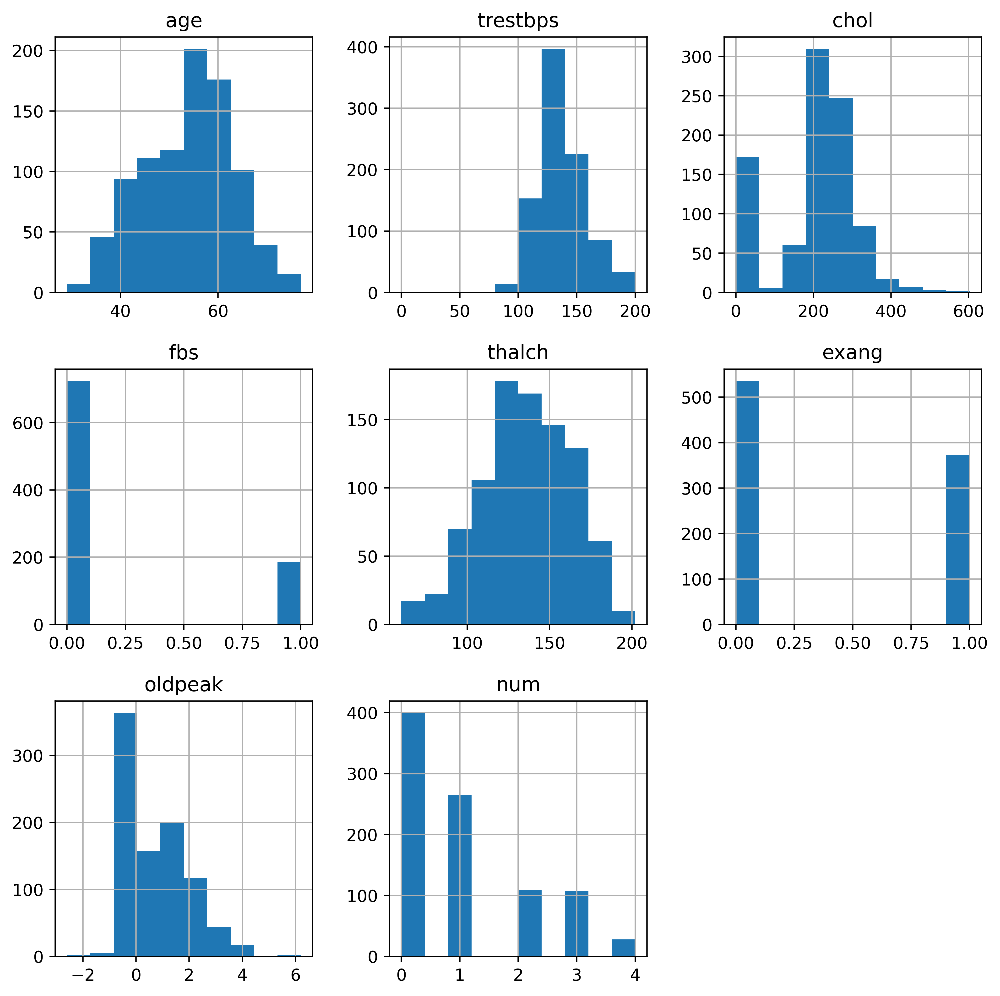

In [27]:
df.hist()

In [29]:
heartdf = df

In [31]:
num_cols = heartdf.select_dtypes(["int64"])

In [33]:
plt.figure(figsize=(30,15))
for i in enumerate(num_cols):
    plt.subplot(3,4,i[0]+1)
    ax = sns.boxplot(heartdf[i[1]])
    ax.set_xlabel(i[1],fontsize=20)

plt.tight_layout()
plt.show()


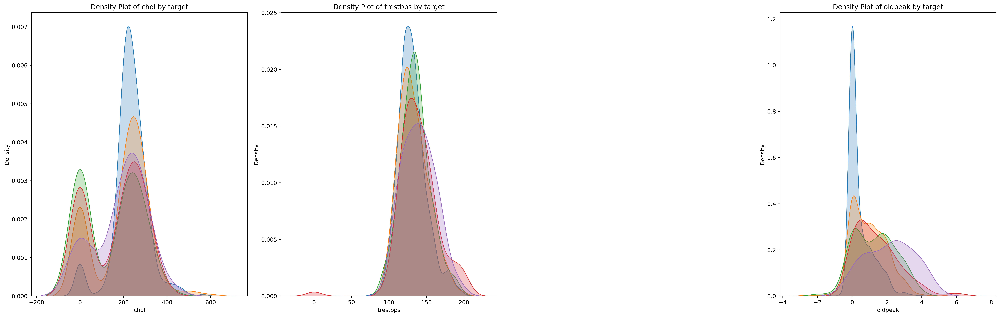

In [35]:
fig = plt.figure(figsize = (25, 8))

# ----------------------------------------------------------------------------------------------------
# plot the data
# the idea is to iterate over each class
# extract their data ad plot a sepate density plot
for i in heartdf["num"].unique():
    # extract the data
    x = heartdf[heartdf["num"] == i]["chol"]
    # plot the data using seaborn
    plt.subplot(1,4,1)
    sns.kdeplot(x, shade=True, label = "{} target".format(i))

# set the title of the plot
plt.title("Density Plot of chol by target")

# ----------------------------------------------------------------------------------------------------
# plot the data
# the idea is to iterate over each class
# extract their data ad plot a sepate density plot
for i in heartdf["num"].unique():
    # extract the data
    x = heartdf[heartdf["num"] == i]["trestbps"]
    # plot the data using seaborn
    plt.subplot(1,4,2)
    sns.kdeplot(x, shade=True, label = "{} target".format(i))

# set the title of the plot
plt.title("Density Plot of trestbps by target")

# ----------------------------------------------------------------------------------------------------
# plot the data
# the idea is to iterate over each class
# extract their data ad plot a sepate density plot
# for i in heartdf["num"].unique():
#     # extract the data
#     x = heartdf[heartdf["num"] == i]["thalach"]
#     # plot the data using seaborn
#     plt.subplot(1,4,3)
#     sns.kdeplot(x, shade=True, label = "{} target".format(i))

# # set the title of the plot
# plt.title("Density Plot of thalach by target")

# ----------------------------------------------------------------------------------------------------
# plot the data
# the idea is to iterate over each class
# extract their data ad plot a sepate density plot
for i in heartdf["num"].unique():
    # extract the data
    x = heartdf[heartdf["num"] == i]["oldpeak"]
    # plot the data using seaborn
    plt.subplot(1,4,4)
    sns.kdeplot(x, shade=True, label = "{} target".format(i))

# set the title of the plot
plt.title("Density Plot of oldpeak by target")

plt.tight_layout()
plt.show()

#### As Decision tree handle outlier so we kept as it is

In [38]:
# Replace zero values with NaN in specific columns
import numpy as np
columns_to_check = ['trestbps', 'chol']
for col in columns_to_check:
    df[col] = df[col].replace(0, np.nan)

In [40]:
df.isna().sum()

age           0
sex           0
cp            0
trestbps      1
chol        172
fbs           0
restecg       0
thalch        0
exang         0
oldpeak       0
slope         0
thal          0
num           0
dtype: int64

In [46]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df['sex'] = le.fit_transform(df['sex'])


In [48]:
# Replace zero values with NaN in specific columns
import numpy as np
columns_to_check = ['trestbps', 'chol']
for col in columns_to_check:
    df[col] = df[col].replace(0, np.nan)

In [50]:
df
from sklearn.impute import SimpleImputer
Si = SimpleImputer(strategy = 'median')
# Replace missing values with the median of the respective column   
df.iloc[:,3:5] = Si.fit_transform(df.iloc[:,3:5])

In [52]:
df.isna().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalch      0
exang       0
oldpeak     0
slope       0
thal        0
num         0
dtype: int64

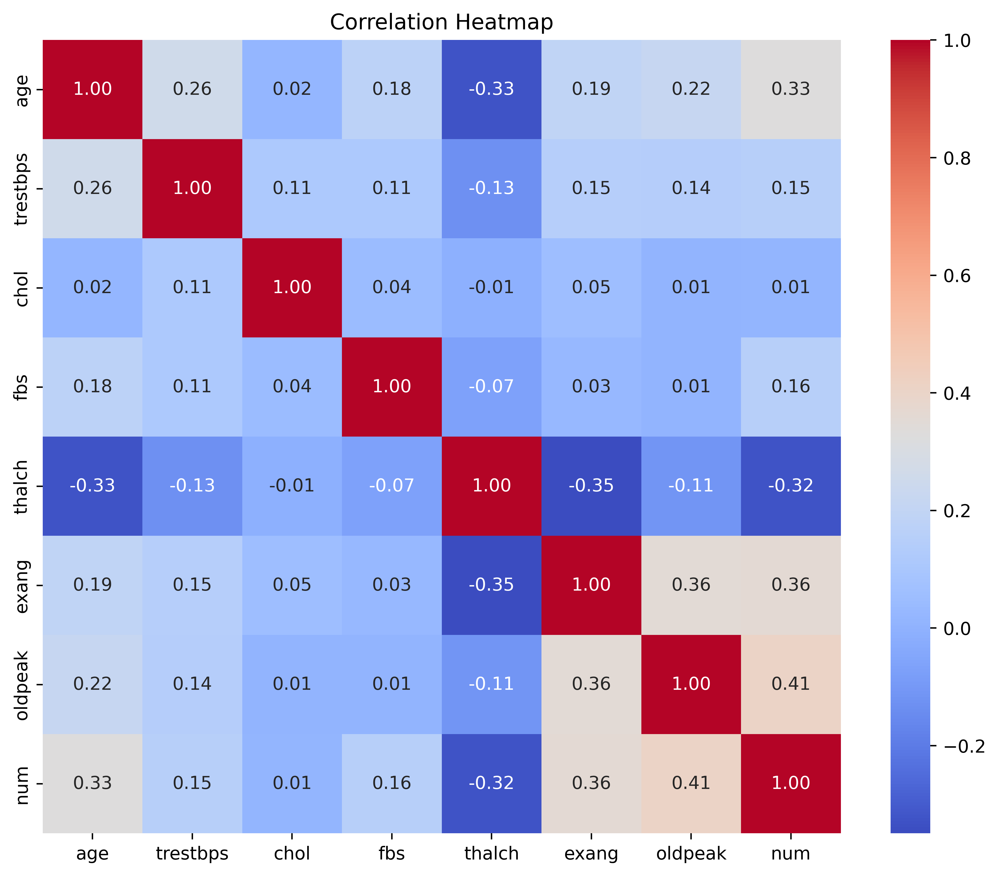

In [76]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric (int/float) columns
numeric_df = df.select_dtypes(include=['int64', 'float64'])

# Calculate correlation
corr_matrix = numeric_df.corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()


In [78]:
sns.pairplot(df)

In [80]:
df.dtypes=='object'

age                       False
sex                       False
cp                        False
trestbps                  False
chol                      False
fbs                       False
restecg                   False
thalch                    False
exang                     False
oldpeak                   False
slope                     False
num                       False
thal_fixed defect         False
thal_normal               False
thal_reversable defect    False
dtype: bool

In [82]:
cat_cols = df.astype("object").columns.drop(['sex',"slope"])

In [84]:
from sklearn.preprocessing import OrdinalEncoder
oe = OrdinalEncoder()
df[cat_cols] = oe.fit_transform(df[cat_cols])

In [86]:
df

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,num,thal_fixed defect,thal_normal,thal_reversable defect
0,34.0,1,3.0,46.0,88.0,1.0,0.0,79.0,0.0,33.0,0,0.0,1.0,0.0,0.0
1,12.0,1,1.0,38.0,58.0,0.0,1.0,61.0,0.0,10.0,1,0.0,1.0,0.0,0.0
2,28.0,1,0.0,42.0,47.0,0.0,1.0,77.0,0.0,14.0,1,0.0,1.0,0.0,0.0
3,23.0,1,3.0,22.0,43.0,0.0,0.0,117.0,0.0,10.0,1,0.0,1.0,0.0,0.0
4,28.0,1,0.0,15.0,56.0,0.0,1.0,55.0,1.0,25.0,1,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,24.0,1,0.0,28.0,95.0,0.0,1.0,49.0,0.0,25.0,2,4.0,1.0,0.0,0.0
904,33.0,1,0.0,62.0,27.0,0.0,2.0,49.0,1.0,39.0,1,4.0,1.0,0.0,0.0
905,27.0,1,2.0,65.0,95.0,0.0,0.0,52.0,1.0,35.0,0,4.0,1.0,0.0,0.0
906,27.0,1,2.0,45.0,63.0,1.0,2.0,34.0,1.0,15.0,0,4.0,0.0,0.0,1.0


In [88]:
df.dtypes

age                       float64
sex                         int32
cp                        float64
trestbps                  float64
chol                      float64
fbs                       float64
restecg                   float64
thalch                    float64
exang                     float64
oldpeak                   float64
slope                       int32
num                       float64
thal_fixed defect         float64
thal_normal               float64
thal_reversable defect    float64
dtype: object

In [90]:
df = pd.get_dummies(df, columns=['sex',"slope"])

In [92]:
from sklearn.preprocessing import StandardScaler
st = StandardScaler()
df1 = pd.DataFrame(st.fit_transform(df), columns=df.columns)

In [94]:
x = df.drop(columns='num')
y = df["num"]

In [96]:
x

,age,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,thal_fixed defect,thal_normal,thal_reversable defect,sex_0,sex_1,slope_0,slope_1,slope_2
0,34.0,3.0,46.0,88.0,1.0,0.0,79.0,0.0,33.0,1.0,0.0,0.0,False,True,True,False,False
1,12.0,1.0,38.0,58.0,0.0,1.0,61.0,0.0,10.0,1.0,0.0,0.0,False,True,False,True,False
2,28.0,0.0,42.0,47.0,0.0,1.0,77.0,0.0,14.0,1.0,0.0,0.0,False,True,False,True,False
3,23.0,3.0,22.0,43.0,0.0,0.0,117.0,0.0,10.0,1.0,0.0,0.0,False,True,False,True,False
4,28.0,0.0,15.0,56.0,0.0,1.0,55.0,1.0,25.0,1.0,0.0,0.0,False,True,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,24.0,0.0,28.0,95.0,0.0,1.0,49.0,0.0,25.0,1.0,0.0,0.0,False,True,False,False,True
904,33.0,0.0,62.0,27.0,0.0,2.0,49.0,1.0,39.0,1.0,0.0,0.0,False,True,False,True,False
905,27.0,2.0,65.0,95.0,0.0,0.0,52.0,1.0,35.0,1.0,0.0,0.0,False,True,True,False,False
906,27.0,2.0,45.0,63.0,1.0,2.0,34.0,1.0,15.0,0.0,0.0,1.0,False,True,True,False,False


In [98]:
y

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
903    4.0
904    4.0
905    4.0
906    4.0
907    4.0
Name: num, Length: 908, dtype: float64

In [100]:
x_train, x_test,y_train,y_test = train_test_split(x,y,test_size=0.2 ,random_state=444)

In [102]:
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)

y_pred = dt.predict(x_test)

from sklearn.metrics import classification_report

print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.71      0.60      0.65        90
         1.0       0.38      0.49      0.43        51
         2.0       0.36      0.35      0.36        23
         3.0       0.31      0.31      0.31        16
         4.0       0.00      0.00      0.00         2

    accuracy                           0.51       182
   macro avg       0.35      0.35      0.35       182
weighted avg       0.53      0.51      0.51       182



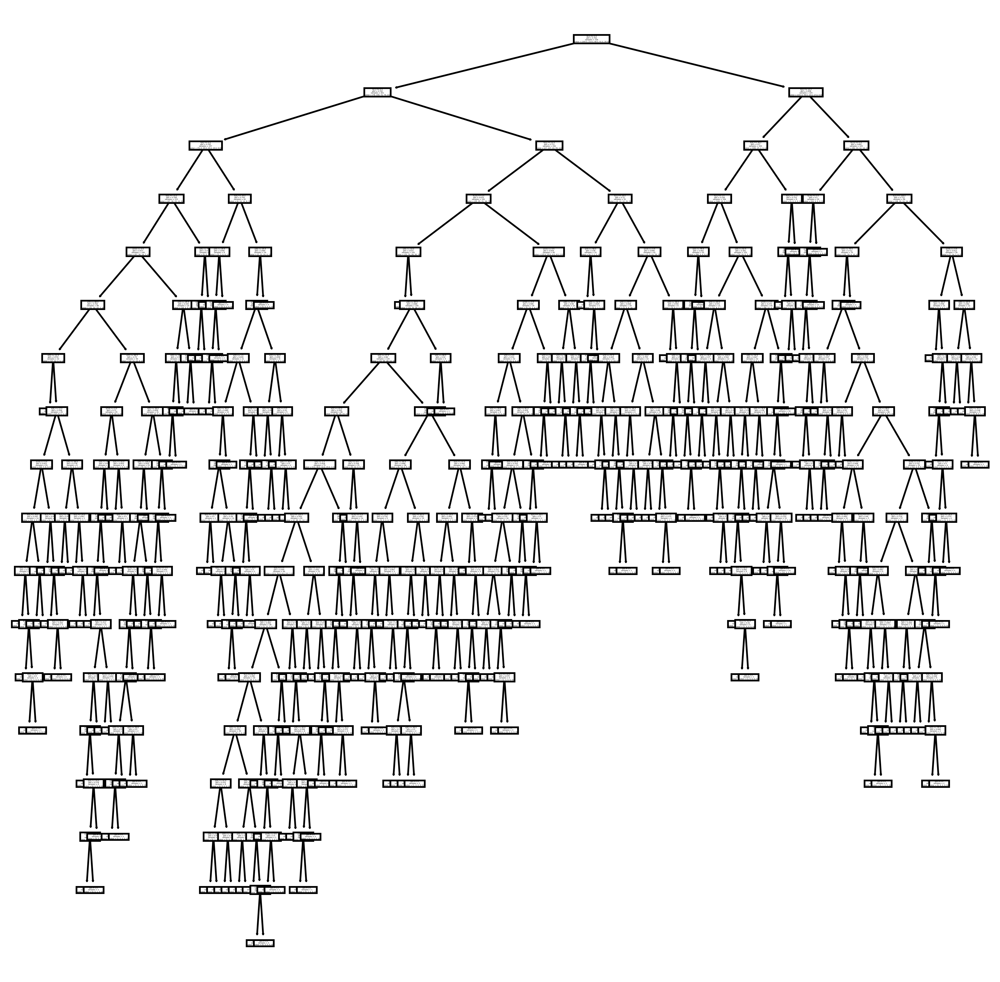

In [104]:
tree.plot_tree(dt)
plt.show()

In [106]:
print('Training accuracy: ', dt.score(x_train,y_train))
print('Testing Accuracy: ', dt.score(x_test,y_test))

Training accuracy:  1.0
Testing Accuracy:  0.5054945054945055


In [108]:
plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams['figure.dpi'] = 250

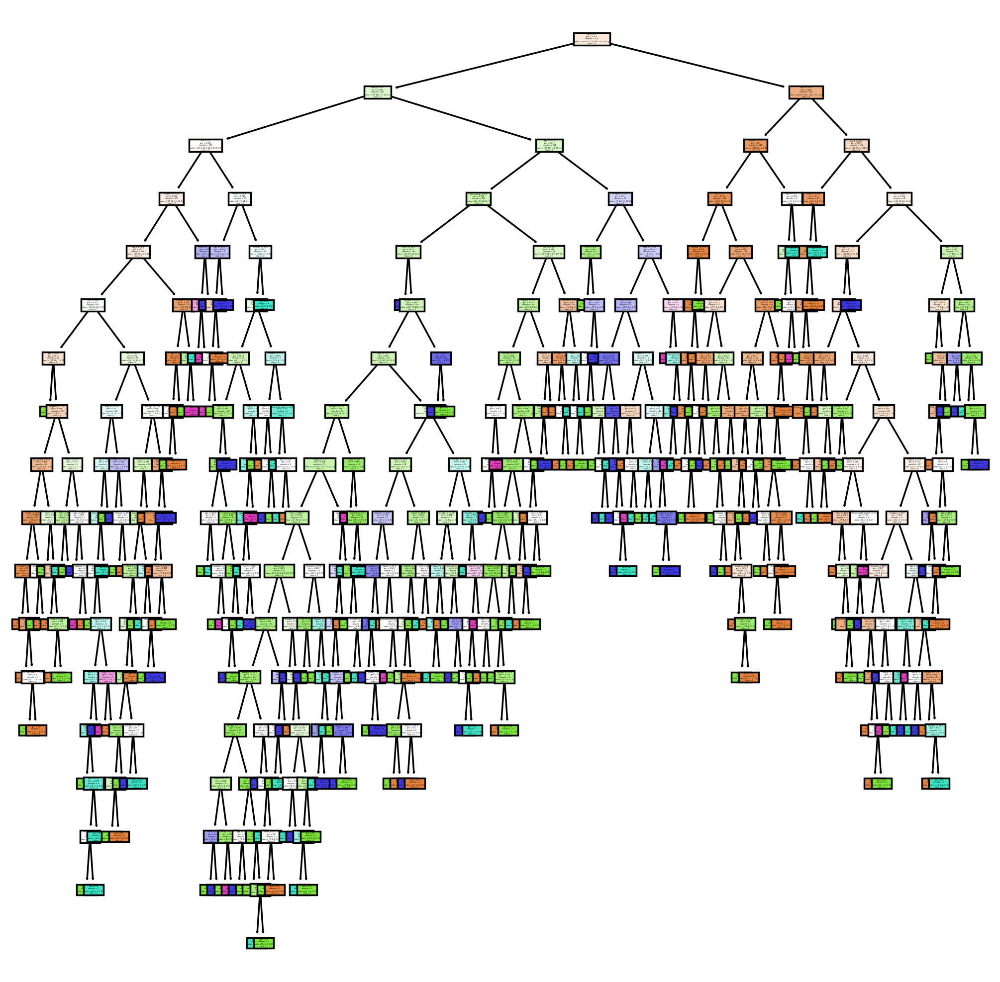

In [110]:
tree.plot_tree(dt, feature_names=x.columns, 
               class_names=["0","1","2","3","4"],
              filled=True)
plt.show()

In [112]:
dt.feature_importances_

array([0.15272331, 0.1423334 , 0.11889422, 0.10642735, 0.02507675,
       0.04197198, 0.1298989 , 0.02154465, 0.1262145 , 0.00875563,
       0.02378022, 0.01099235, 0.01425125, 0.01375248, 0.02743833,
       0.00987591, 0.02606878])

In [114]:
from sklearn.model_selection import GridSearchCV

In [116]:
params = {
    'criterion' : ['gini', 'entropy', 'log_loss'],
    'max_depth' : [1,2,3,4,5,6,7,8],
    'min_samples_split' : [2,3,4,6,8,10,12],
    'max_leaf_nodes' : [8,10,12,14,16,18,19],
    'min_samples_leaf' : [1,2,3,4,5,6,7]
}

In [118]:
grid = GridSearchCV(DecisionTreeClassifier(), param_grid=params, cv = 5, verbose=1)

In [120]:
grid.fit(x_train,y_train)

Fitting 5 folds for each of 8232 candidates, totalling 41160 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8],
                         'max_leaf_nodes': [8, 10, 12, 14, 16, 18, 19],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7],
                         'min_samples_split': [2, 3, 4, 6, 8, 10, 12]},
             verbose=1)

In [122]:
grid.best_params_

{'criterion': 'entropy',
 'max_depth': 4,
 'max_leaf_nodes': 8,
 'min_samples_leaf': 7,
 'min_samples_split': 2}

In [124]:
reg = DecisionTreeClassifier(criterion='entropy',max_depth=4,
                           max_leaf_nodes=8,min_samples_split=2, min_samples_leaf=7)

In [126]:
reg.fit(x_train,y_train)
ypred = reg.predict(x_test)

In [128]:
reg.score(x_train,y_train),reg.score(x_test,y_test)

(0.5578512396694215, 0.5769230769230769)

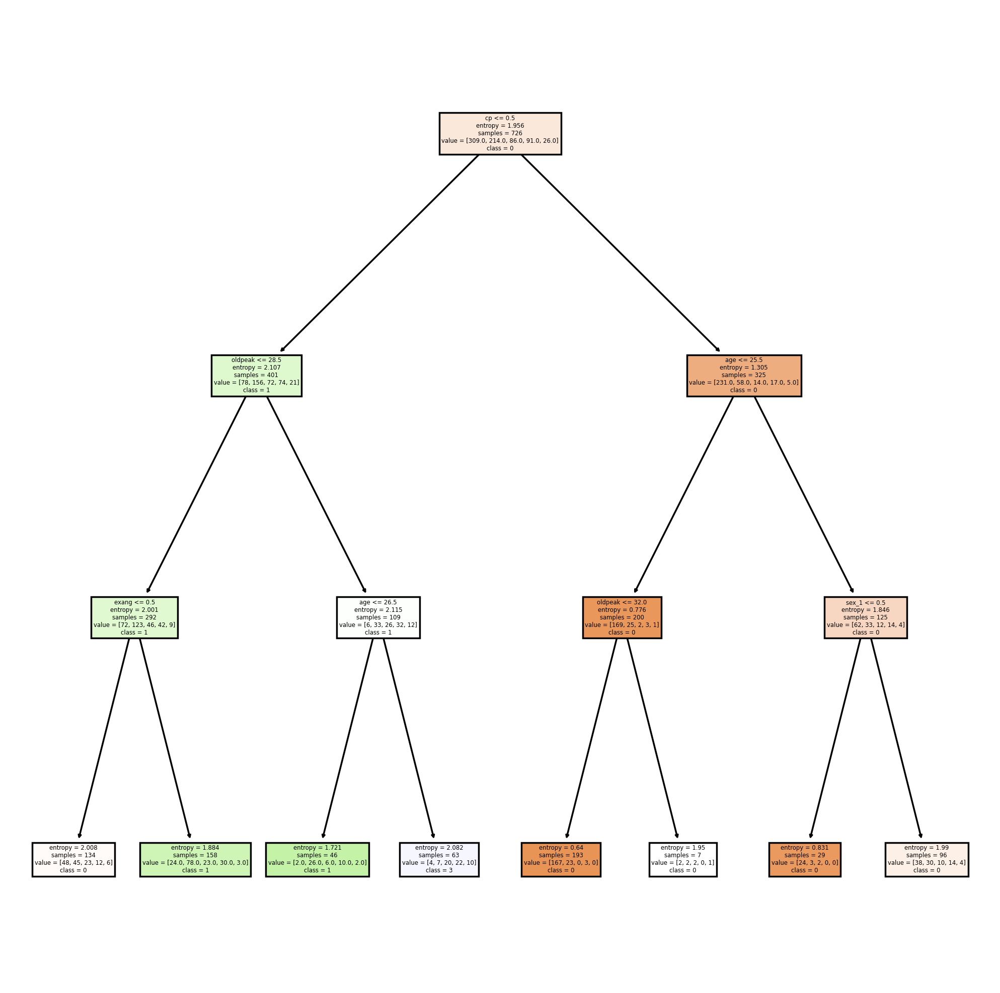

In [130]:
tree.plot_tree(reg, feature_names=x.columns, 
               class_names=["0","1","2","3","4"],
              filled=True)
plt.show()